In [2]:
using Pkg
Pkg.activate("..")
Pkg.status()

    Status `../Project.toml`
  [336ed68f] CSV v0.3.1
  [0c46a032] DifferentialEquations v5.3.0
  [31c24e10] Distributions v0.16.3
  [38e38edf] GLM v1.0.0
  [7073ff75] IJulia v1.11.1
  [c8e1da08] IterTools v1.0.0
  [b964fa9f] LaTeXStrings v1.0.2
  [5fb14364] OhMyREPL v0.3.0
  [91a5bcdd] Plots v0.20.1
  [438e738f] PyCall v1.18.4
  [60ddc479] StatPlots v0.8.1
  [1cfade01] UnicodeFun v0.4.0
  [b8865327] UnicodePlots v0.3.1


In [3]:
using Plots, DifferentialEquations

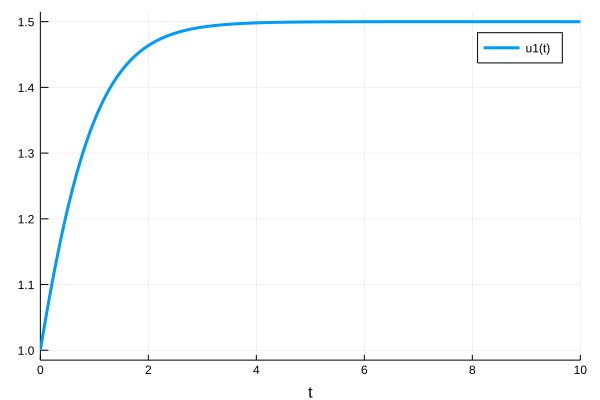

In [16]:
f(u,p,t) = u* (p[1] - p[2] - ((p[3]*u)) )
u0=1.0; p = [2.5,1.0,1.0]
tspan = (0.0,10.0)
prob = ODEProblem(f,u0,tspan,p)
sol = solve(prob)
t = range(0,stop=10,length=100)
biomass_sim = sol(t).u

plot(sol)

In [17]:
#analytic
function solution(u0,u,r,a,t)
    top = (u-r)*exp((u-r)*t)
    bot = a*exp((u-r)*t) + ((u-r)/u0) - a
    return(top/bot)
end

analytic_sim = solution.(1.0,p[1],p[2],p[3],range(0,stop=10,length=100))

100-element Array{Float64,1}:
 1.0               
 1.049169371233356 
 1.095459544243205 
 1.1386338225083747
 1.1785524369555933
 1.2151645048976905
 1.2484964349479268
 1.278638355455555 
 1.3057299638782949
 1.3299468984634537
 1.351488397692852 
 1.370566694658633 
 1.3873983277439628
 ⋮                 
 1.4999987853033894
 1.4999989560837095
 1.4999991028531778
 1.4999992289875952
 1.4999993373881437
 1.4999994305481146
 1.4999995106102553
 1.4999995794160552
 1.4999996385480991
 1.499999689366469 
 1.4999997330400257
 1.4999997705732946

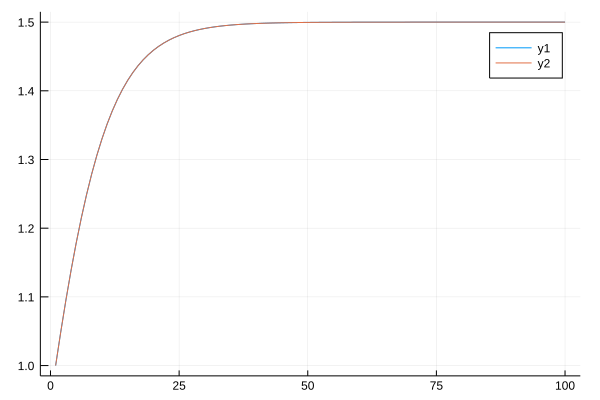

In [18]:
plot((hcat(biomass_sim,analytic_sim)))

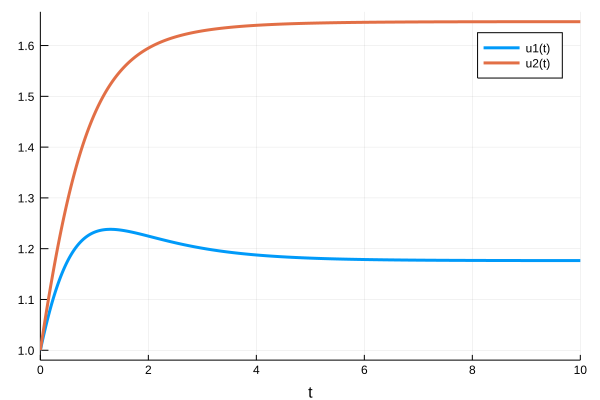

In [20]:
function dc(dc,c,p,t)
    dc[1] = c[1] * ( p[1] - (c[1]*p[2]) - (c[2]*p[3]) ) 
    dc[2] = c[2] * ( p[4] - (c[2]*p[5]) - (c[1]*p[6]) )
end

u0=[1.0;1.0]; p = [2.0,1.0,0.5,2.0,1.0,0.3]
tspan = (0.0,10.0)
prob = ODEProblem(dc,u0,tspan,p)
sol = solve(prob)
t = range(0,stop=10,length=100)
biomass_sim = sol(t).u
plot(sol)

In [16]:
sol[end]

2-element Array{Float64,1}:
  1.9795460229270166e-18
 20.00000000000049      

In [17]:
(1.0*2.0 - 10.0*2.0)/(1.0-100)

0.18181818181818182